In [40]:
import pandas as pd
import folium
from pandas_profiling import ProfileReport
from IPython.display import HTML
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import contextily as ctx
import milton_maps as mm
import seaborn as sns

In [2]:
town_boundaries = gpd.read_file("../data/processed/town_boundaries.shp.zip").set_index("TOWN_ID")
milton_boundaries = town_boundaries[town_boundaries.TOWN.isin(["MILTON"])]

In [3]:
crash_data = pd.read_excel("../data/raw/CrashDetails_cwzqv2fitj4m5ovin0xrkq11.xls", skiprows=6)
crash_data.shape

WARNING *** file size (3678144) not 512 + multiple of sector size (512)


(4571, 28)

In [4]:
crash_data.head(10)

,RMV Crash Number,City Town Name,Crash Date,Crash Time,Crash Severity,Maximum Injury Severity Reported,Number of Vehicles,Total Nonfatal Injuries,Total Fatal Injuries,Manner of Collision,...,Ambient Light,Weather Condition,At Roadway Intersection,Distance From Nearest Roadway Intersection,Distance From Nearest Milemarker,Distance From Nearest Exit,Distance From Nearest Landmark,Non Motorist Type,X Cooordinate,Y Cooordinate
0,4136317,MILTON,01-Jan-2016,2:50 AM,Property damage only (none injured),No injury,2.0,0.0,0.0,"Sideswipe, same direction",...,Dark - lighted roadway,Clear,NaN,Rte 93 S / UNKNOWN,NaN,Exit 9 on Rte 93 S,NaN,NaN,237954.181333,889568.707045
1,4138031,MILTON,03-Jan-2016,2:30 AM,Property damage only (none injured),No injury,1.0,0.0,0.0,Single vehicle crash,...,Dark - roadway not lighted,Cloudy,NaN,UNQUITY ROAD / HARLAND STREET,NaN,NaN,CAMP SAYRE,NaN,233823.778861,887239.065913
2,4170301,MILTON,03-Jan-2016,3:08 AM,Property damage only (none injured),No injury,3.0,0.0,0.0,"Sideswipe, same direction",...,Dark - lighted roadway,Clear/Clear,REEDSDALE ROAD / THOMPSON LANE,REEDSDALE ROAD / THOMPSON LANE,NaN,NaN,NaN,NaN,234704.583122,889639.264997
3,4170346,MILTON,03-Jan-2016,11:28 AM,Property damage only (none injured),No injury,2.0,0.0,0.0,Rear-end,...,Daylight,Cloudy,NaN,1249 RANDOLPH AVENUE Rte 28,NaN,NaN,NaN,NaN,235426.833031,886303.215857
4,4170384,MILTON,03-Jan-2016,6:47 PM,Property damage only (none injured),No injury,1.0,0.0,0.0,Single vehicle crash,...,Dark - lighted roadway,Clear/Clear,NaN,1043 RANDOLPH AVENUE,NaN,NaN,NaN,NaN,235455.851915,887025.734960
5,4170300,MILTON,04-Jan-2016,7:36 AM,Non-fatal injury,Non-fatal injury - Possible,3.0,3.0,0.0,Rear-end,...,Daylight,Cloudy,NaN,590 RANDOLPH AVENUE Rte 28,NaN,NaN,NaN,NaN,235554.657386,888798.446842
6,4172349,MILTON,05-Jan-2016,12:02 AM,Property damage only (none injured),No injury,1.0,0.0,0.0,Single vehicle crash,...,Dark - lighted roadway,Clear,RANDOLPH AVENUE / REEDSDALE ROAD,RANDOLPH AVENUE / REEDSDALE ROAD,NaN,NaN,NaN,NaN,235553.115602,888768.223461
7,4170299,MILTON,05-Jan-2016,8:43 AM,Property damage only (none injured),No injury,3.0,0.0,0.0,Rear-end,...,Daylight,Clear,NaN,384 CENTRAL AVENUE,NaN,NaN,NaN,NaN,234574.482775,889931.291720
8,4172298,MILTON,05-Jan-2016,2:47 PM,Property damage only (none injured),No injury,2.0,0.0,0.0,"Sideswipe, same direction",...,Daylight,Clear,BRUSH HILL ROAD / BLUE HILL AVENUE Rte SR138 S,BRUSH HILL ROAD / BLUE HILL AVENUE Rte SR138 S,NaN,NaN,NaN,NaN,233466.280912,890649.454822
9,4172293,MILTON,06-Jan-2016,5:39 AM,Non-fatal injury,Non-fatal injury - Non-incapacitating,2.0,2.0,0.0,Rear-end,...,Dark - lighted roadway,Clear,BLUE HILL AVENUE / DOLLAR LANE,BLUE HILL AVENUE / DOLLAR LANE,NaN,NaN,NaN,NaN,231949.470671,886895.988963


Data transformation notes:

* Need to parse Crash Date + Crash Time into a datetime field.
* Transform Crash Severity into a categorical variable.
* Transform Manner of Collission into a categorical variable.

In [5]:
print(f"{crash_data[crash_data['X Cooordinate'].isnull()].shape[0]} records are missing coordinates.  We'll drop these for now.")

310 records are missing coordinates.  We'll drop these for now.


In [6]:
crash_data = crash_data[~crash_data['X Cooordinate'].isnull()]

In [7]:
geometry = [Point(row['X Cooordinate'], row['Y Cooordinate']) for i, row in crash_data.iterrows()]

In [8]:
crash_geodf = gpd.GeoDataFrame(data=crash_data, geometry=geometry, crs="EPSG:26986")

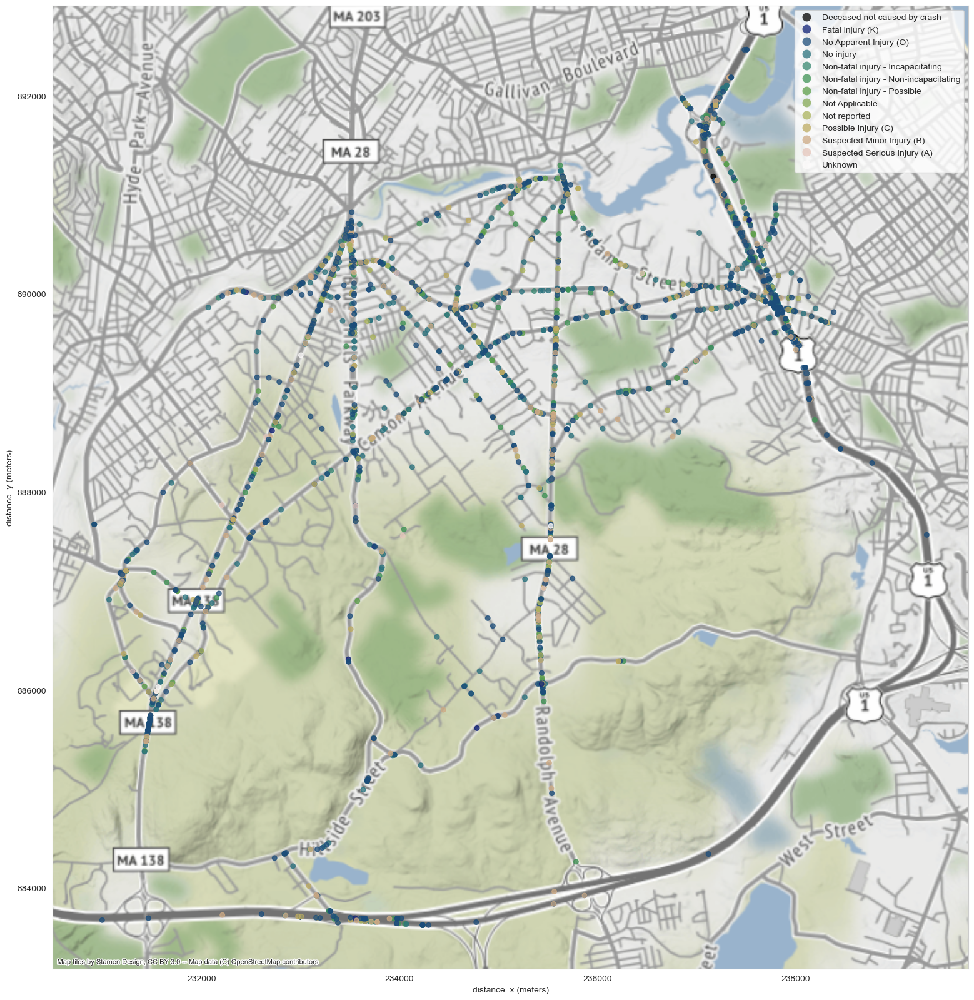

In [9]:
fig, ax = plt.subplots(1, figsize=(20,20))
ax = mm.plot_map(crash_geodf,
                 column="Maximum Injury Severity Reported",
                 categorical=True,
                 markersize=30,
                 alpha=0.75,
                 ax=ax
                 )

ctx.add_basemap(ax, crs="EPSG:26986")

Questions:

* How to identify accidents along Randolph Avenue?

In [10]:
injury_map = {
     'No injury': 'No Injury',
     'Non-fatal injury - Possible': 'Minor Injury',
     'Non-fatal injury - Non-incapacitating': 'Minor Injury',
     'Non-fatal injury - Incapacitating': "Major Injury",
     'Not reported': "Unknown",
     'Fatal injury (K)': "Fatal Injury",
     'Unknown': "Unknown",
     'Not Applicable': "No Injury",
     'Deceased not caused by crash': "No Injury",
     'No Apparent Injury (O)': "No Injury",
     'Suspected Minor Injury (B)': "Minor Injury",
     'Possible Injury (C)': "Minor Injury",
     'Suspected Serious Injury (A)': "Major Injury",
}

crash_geodf['severity'] = crash_geodf['Maximum Injury Severity Reported'].fillna("Unknown").map(injury_map)

In [11]:
colormap = {
    "Unknown": "gray",
    "No Injury": "blue",
    "Minor Injury": "yellow",
    "Major Injury": "orange",
    "Fatal Injury": "red",
}

In [12]:
crash_geodf.columns

Index(['RMV Crash Number', 'City Town Name', 'Crash Date', 'Crash Time',
       'Crash Severity', 'Maximum Injury Severity Reported',
       'Number of Vehicles', 'Total Nonfatal Injuries', 'Total Fatal Injuries',
       'Manner of Collision', 'Unnamed: 10', 'Vehicle Action Prior to Crash',
       'Vehicle Travel Directions', 'Unnamed: 13', 'Unnamed: 14',
       'Most Harmful Events', 'Vehicle Configuration',
       'Road Surface Condition', 'Ambient Light', 'Weather Condition',
       'At Roadway Intersection', 'Distance From Nearest Roadway Intersection',
       'Distance From Nearest Milemarker', 'Distance From Nearest Exit',
       'Distance From Nearest Landmark', 'Non Motorist Type', 'X Cooordinate',
       'Y Cooordinate', 'geometry', 'severity'],
      dtype='object')

In [19]:
map_center = milton_boundaries.to_crs("EPSG:4326").loc[189].geometry.centroid
milton_map = folium.Map(width=800,height=800, location=[map_center.y, map_center.x], zoom_start=13)

for i, row in crash_geodf.to_crs("EPSG:4326").iterrows():
    folium.CircleMarker(
        (row.geometry.y, row.geometry.x),
        radius=5,
        color=colormap[row['severity']],
        popup=folium.Popup(f"""
        Crash Date: {row['Crash Date']}<br>
        Crash Time: {row['Crash Time']}<br>
        Weather Conditions: {row['Weather Condition']}<br>
        Maximum Injury Severity Reported: {row['Maximum Injury Severity Reported']}
        """
        )
    ).add_to(milton_map)
display(milton_map)

In [20]:
crash_geodf.head()

,RMV Crash Number,City Town Name,Crash Date,Crash Time,Crash Severity,Maximum Injury Severity Reported,Number of Vehicles,Total Nonfatal Injuries,Total Fatal Injuries,Manner of Collision,...,At Roadway Intersection,Distance From Nearest Roadway Intersection,Distance From Nearest Milemarker,Distance From Nearest Exit,Distance From Nearest Landmark,Non Motorist Type,X Cooordinate,Y Cooordinate,geometry,severity
0,4136317,MILTON,01-Jan-2016,2:50 AM,Property damage only (none injured),No injury,2.0,0.0,0.0,"Sideswipe, same direction",...,NaN,Rte 93 S / UNKNOWN,NaN,Exit 9 on Rte 93 S,NaN,NaN,237954.181333,889568.707045,POINT (237954.181 889568.707),No Injury
1,4138031,MILTON,03-Jan-2016,2:30 AM,Property damage only (none injured),No injury,1.0,0.0,0.0,Single vehicle crash,...,NaN,UNQUITY ROAD / HARLAND STREET,NaN,NaN,CAMP SAYRE,NaN,233823.778861,887239.065913,POINT (233823.779 887239.066),No Injury
2,4170301,MILTON,03-Jan-2016,3:08 AM,Property damage only (none injured),No injury,3.0,0.0,0.0,"Sideswipe, same direction",...,REEDSDALE ROAD / THOMPSON LANE,REEDSDALE ROAD / THOMPSON LANE,NaN,NaN,NaN,NaN,234704.583122,889639.264997,POINT (234704.583 889639.265),No Injury
3,4170346,MILTON,03-Jan-2016,11:28 AM,Property damage only (none injured),No injury,2.0,0.0,0.0,Rear-end,...,NaN,1249 RANDOLPH AVENUE Rte 28,NaN,NaN,NaN,NaN,235426.833031,886303.215857,POINT (235426.833 886303.216),No Injury
4,4170384,MILTON,03-Jan-2016,6:47 PM,Property damage only (none injured),No injury,1.0,0.0,0.0,Single vehicle crash,...,NaN,1043 RANDOLPH AVENUE,NaN,NaN,NaN,NaN,235455.851915,887025.734960,POINT (235455.852 887025.735),No Injury


In [23]:
crash_geodf['crash_time'] = pd.to_datetime(crash_geodf['Crash Date'] + " " + crash_geodf['Crash Time'])

In [24]:
crash_geodf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 4261 entries, 0 to 4568
Data columns (total 31 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   RMV Crash Number                            4261 non-null   object        
 1   City Town Name                              4261 non-null   object        
 2   Crash Date                                  4261 non-null   object        
 3   Crash Time                                  4261 non-null   object        
 4   Crash Severity                              4261 non-null   object        
 5   Maximum Injury Severity Reported            4261 non-null   object        
 6   Number of Vehicles                          4261 non-null   float64       
 7   Total Nonfatal Injuries                     4261 non-null   float64       
 8   Total Fatal Injuries                        4261 non-null   float64       
 9   

In [25]:
roads_df = gpd.read_file("../data/raw/MassDOT_Roads_SHP/EOTMAJROADS_RTE_MAJOR.shp")

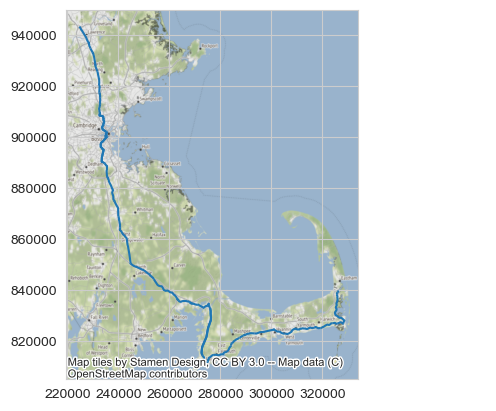

In [32]:
ax = roads_df[roads_df.RT_NUMBER=="28"].plot()
ctx.add_basemap(ax, crs="EPSG:26986")

/opt/anaconda3/envs/milton-maps/lib/python3.10/site-packages/geopandas/tools/clip.py:67: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


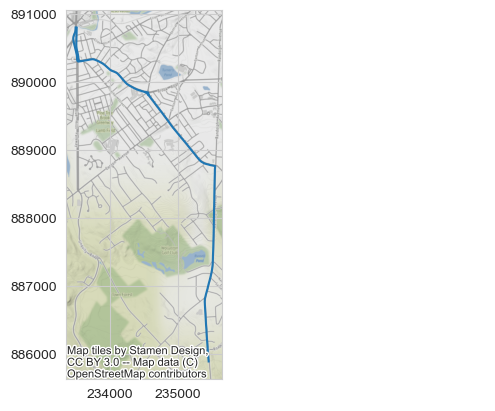

In [33]:
rt28 = roads_df[roads_df.RT_NUMBER=="28"]
milton_rt_28 = gpd.clip(rt28, milton_boundaries)
ax = milton_rt_28.plot()
ctx.add_basemap(ax, crs="EPSG:26986")

In [35]:
df_nearest_major_road = gpd.sjoin_nearest(crash_geodf, roads_df, how="left", distance_col="distance_to_major_road")

In [36]:
df_nearest_major_road.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 7884 entries, 0 to 4568
Data columns (total 36 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   RMV Crash Number                            7884 non-null   object        
 1   City Town Name                              7884 non-null   object        
 2   Crash Date                                  7884 non-null   object        
 3   Crash Time                                  7884 non-null   object        
 4   Crash Severity                              7884 non-null   object        
 5   Maximum Injury Severity Reported            7884 non-null   object        
 6   Number of Vehicles                          7884 non-null   float64       
 7   Total Nonfatal Injuries                     7884 non-null   float64       
 8   Total Fatal Injuries                        7884 non-null   float64       
 9   

In [37]:
rt_28_crashes = df_nearest_major_road[(df_nearest_major_road.RT_NUMBER=="28") & (df_nearest_major_road.distance_to_major_road < 10.0)]
rt_28_crashes

,RMV Crash Number,City Town Name,Crash Date,Crash Time,Crash Severity,Maximum Injury Severity Reported,Number of Vehicles,Total Nonfatal Injuries,Total Fatal Injuries,Manner of Collision,...,X Cooordinate,Y Cooordinate,geometry,severity,crash_time,index_right,ADMIN_TYPE,RT_NUMBER,SHAPE_LEN,distance_to_major_road
2,4170301,MILTON,03-Jan-2016,3:08 AM,Property damage only (none injured),No injury,3.0,0.0,0.0,"Sideswipe, same direction",...,234704.583122,889639.264997,POINT (234704.583 889639.265),No Injury,2016-01-03 03:08:00,3,3,28,301154.96848,0.000124
3,4170346,MILTON,03-Jan-2016,11:28 AM,Property damage only (none injured),No injury,2.0,0.0,0.0,Rear-end,...,235426.833031,886303.215857,POINT (235426.833 886303.216),No Injury,2016-01-03 11:28:00,3,3,28,301154.96848,0.000037
4,4170384,MILTON,03-Jan-2016,6:47 PM,Property damage only (none injured),No injury,1.0,0.0,0.0,Single vehicle crash,...,235455.851915,887025.734960,POINT (235455.852 887025.735),No Injury,2016-01-03 18:47:00,3,3,28,301154.96848,0.000186
6,4172349,MILTON,05-Jan-2016,12:02 AM,Property damage only (none injured),No injury,1.0,0.0,0.0,Single vehicle crash,...,235553.115602,888768.223461,POINT (235553.116 888768.223),No Injury,2016-01-05 00:02:00,3,3,28,301154.96848,0.049938
8,4172298,MILTON,05-Jan-2016,2:47 PM,Property damage only (none injured),No injury,2.0,0.0,0.0,"Sideswipe, same direction",...,233466.280912,890649.454822,POINT (233466.281 890649.455),No Injury,2016-01-05 14:47:00,3,3,28,301154.96848,0.000412
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4469,5138218,MILTON,03-Aug-2022,12:59 AM,Property damage only (none injured),No Apparent Injury (O),1.0,0.0,0.0,Single vehicle crash,...,233513.001100,890673.026900,POINT (233513.001 890673.027),No Injury,2022-08-03 00:59:00,3,3,28,301154.96848,0.000959
4484,5154451,MILTON,11-Aug-2022,8:48 AM,Non-fatal injury,Suspected Minor Injury (B),2.0,0.0,0.0,Angle,...,233608.430200,890315.144300,POINT (233608.430 890315.144),Minor Injury,2022-08-11 08:48:00,3,3,28,301154.96848,0.000115
4506,5143294,MILTON,20-Aug-2022,4:31 PM,Property damage only (none injured),No Apparent Injury (O),2.0,0.0,0.0,Rear-end,...,233511.265594,890591.182415,POINT (233511.266 890591.182),No Injury,2022-08-20 16:31:00,3,3,28,301154.96848,0.069996
4523,5144478,MILTON,30-Aug-2022,5:15 PM,Property damage only (none injured),No Apparent Injury (O),2.0,0.0,0.0,Angle,...,233520.676606,890363.794546,POINT (233520.677 890363.795),No Injury,2022-08-30 17:15:00,3,3,28,301154.96848,0.030940


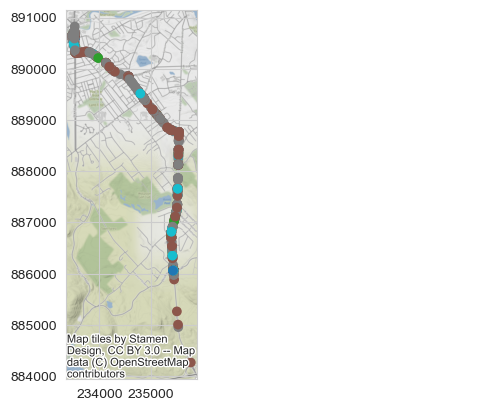

In [39]:
ax = rt_28_crashes.plot(column="severity")
ctx.add_basemap(ax, crs="EPSG:26986")

In [43]:
rt_28_crashes['month_year'] = rt_28_crashes['crash_time'].dt.to_period('M')

In [51]:
df = rt_28_crashes.groupby(["month_year", "severity"])['RMV Crash Number'].count().reset_index()
df

,month_year,severity,RMV Crash Number
0,2016-01,Minor Injury,3
1,2016-01,No Injury,11
2,2016-01,Unknown,1
3,2016-02,Minor Injury,3
4,2016-02,No Injury,4
...,...,...,...
197,2022-07,Minor Injury,1
198,2022-07,No Injury,1
199,2022-08,Minor Injury,1
200,2022-08,No Injury,4


In [59]:
#df.columns
accidents_over_time = df.pivot(index='month_year', columns='severity', values='RMV Crash Number').fillna(0)


<AxesSubplot:xlabel='month_year'>

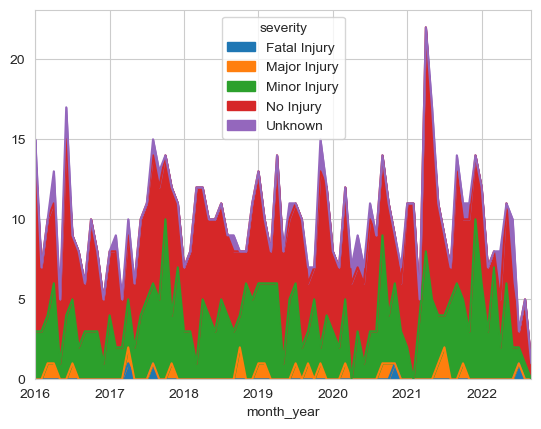

In [66]:
accidents_over_time.plot.area()

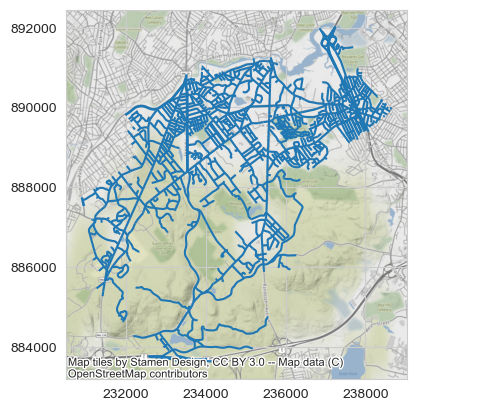

In [67]:
milton_roads_df = gpd.read_file("../data/raw/MassDOT_Roads_SHP/EOTROADS_ARC.shp", mask=milton_boundaries)
ax = milton_roads_df.plot()
ctx.add_basemap(ax,crs="EPSG:26986")

In [68]:
milton_roads_df.head()

,STREETNAME,CLASS,ADMIN_TYPE,RT_NUMBER,ALTRTNUM1,ALTRTNUM2,ALTRTNUM3,ALTRTNUM4,ALTRT1TYPE,RDTYPE,...,RPA,RTA,MILE_COUNT,AADT,AADT_YEAR,AADT_DERIV,LENGTH_MI,LENGTH_FT,SHAPE_LEN,geometry
0,HARLAND STREET,5,0,None,None,None,None,None,0,5,...,MAPC,MBTA,0,0,0,0,0.025421,134.223842,40.911509,"LINESTRING (233820.895 887395.682, 233830.778 ..."
1,WOODMERE DRIVE,5,0,None,None,None,None,None,0,5,...,MAPC,MBTA,0,0,0,0,0.021975,116.026405,35.364919,"LINESTRING (231667.596 888062.852, 231666.406 ..."
2,WOODMERE DRIVE,5,0,None,None,None,None,None,0,5,...,MAPC,MBTA,0,0,0,0,0.219525,1159.089475,353.291178,"LINESTRING (231638.570 888082.893, 231631.157 ..."
3,YANKEE DIVISION HIGHWAY,1,1,93,1,1A,None,None,2,1,...,MAPC,MBTA,0,172586,2014,1,0.631090,3332.154303,1015.642663,"LINESTRING (233639.420 883691.983, 233580.839 ..."
4,SERGEANT WILLIAM G WALSH EXPRESSWAY,1,1,93,1,1A,3,None,2,1,...,MAPC,MBTA,0,183183,2014,3,0.121280,640.356251,195.180976,"LINESTRING (237192.964 891944.299, 237188.144 ..."


<AxesSubplot:>

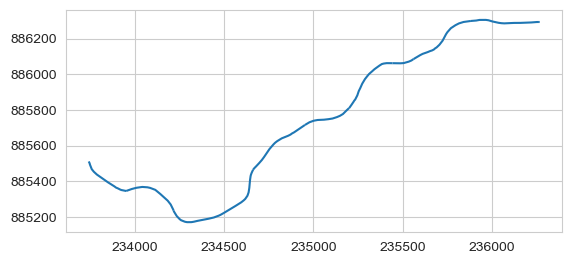

In [91]:
chickatawbut_road = milton_roads_df[milton_roads_df.STREETNAME=="CHICKATAWBUT ROAD"].dissolve()
chickatawbut_road.plot()

<AxesSubplot:>

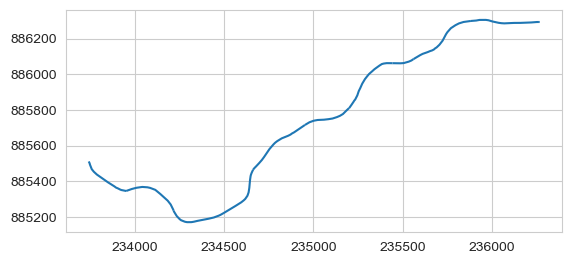

In [90]:
chickatawbut_road.dissolve().plot()

<AxesSubplot:>

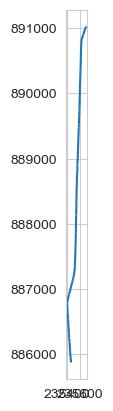

In [92]:
randolph_ave = milton_roads_df[milton_roads_df.STREETNAME=="RANDOLPH AVENUE"].dissolve()
randolph_ave.plot()

<AxesSubplot:>

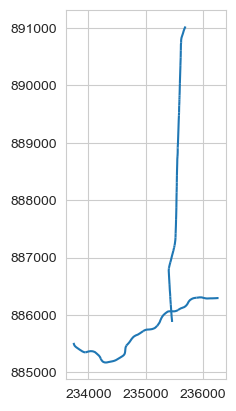

In [97]:
pd.concat([randolph_ave, chickatawbut_road]).plot()

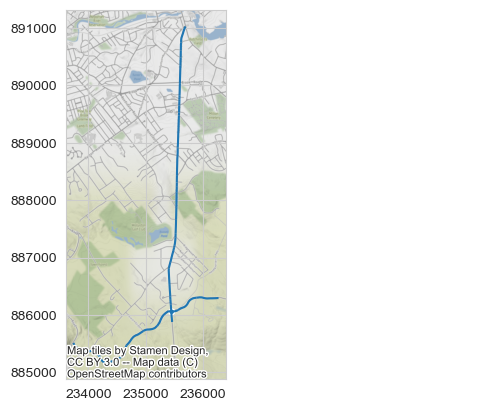

In [110]:
randolph_chickatawbut_intsct = randolph_ave.geometry.intersection(chickatawbut_road.geometry).buffer(50)
ax = pd.concat([randolph_ave, chickatawbut_road]).plot()
ax = randolph_chickatawbut_intsct.plot(ax=ax)
ctx.add_basemap(ax, crs="EPSG:26986")

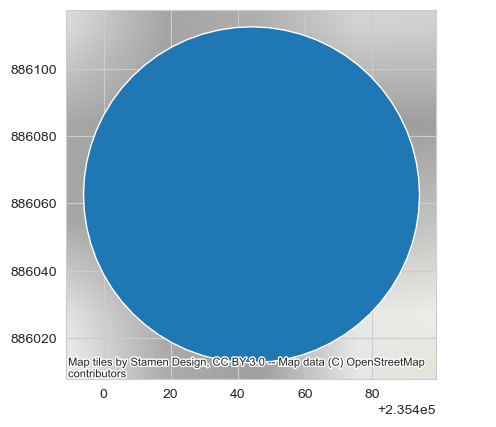

In [108]:
ax = randolph_chickatawbut_intsct.plot()
ctx.add_basemap(ax, crs="EPSG:26986", zoom=12)

In [107]:
randolph_chickatawbut_intsct

0    POLYGON ((235493.881 886062.686, 235493.641 88...
dtype: geometry

In [111]:
193.18/647

0.29857805255023184